# Final project: Amazon Review Fashion Dataset

## Uncovering Consumer Sentiments towards Amazon Fashion Products: A Data Analysis and Sentiment Classification Study

Karen Ardila López

Bootcamp Código Facilito

## Project approach

Amazon is one of the largest companies today, making it a fascinating subject to research. In this case, I chose the Amazon Fashion data because I enjoy buying clothes online, and it is something that has become more widespread and ingrained in the daily lives of many people over the last few years. That is why, for this project, I decided to conduct a data analysis of this dataset, with the goal of analyzing customer sentiment toward the products they purchased. Furthermore, the goal is to obtain insights as a point of improvement for the company, as well as a computational model to predict the sentiment for the test data from the training data, thereby applying the knowledge gained in the data science bootcamp.

Sentiment analysis is textual contextual mining that identifies and extracts subjective information from source material, assisting businesses in understanding the social sentiment of their brand, product, or service while monitoring online conversations. This project consist in basic sentiment analysis.

The goal of this project is to find a way to classify the sentiment of the reviews so that the company can distinguish the contribution that each product makes and what types of products have better or worse sentiments for customers. As a result, they will have a better future experience, as well as increased production of the most positive products, which will increase sales for the company.

Concerning the data: The data is a large crawl of Amazon product reviews, specifically Amazon fashion. The data is in (loose) json format. Initially, no obvious trends are identified due to the large amount of data, so all of the processing learned in the bootcamp is performed, including exploratory data analysis.

### Dataset

This dataset contains product reviews and metadata from Amazon, including 233.1 million reviews spanning May 1996 - Oct 2018.
The category chosen is Amazon Fashion with 883,636 reviews.

Link: https://jmcauley.ucsd.edu/data/amazon_v2/index.html

### Citation

Justifying recommendations using distantly-labeled reviews and fined-grained aspects
Jianmo Ni, Jiacheng Li, Julian McAuley
Empirical Methods in Natural Language Processing (EMNLP), 2019

## Import Dataset

First, import all the necessary libraries.

In [ ]:
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud
import seaborn as sns
import altair as alt
import pandas as pd
import datetime
import gzip
import json

/shared-libs/python3.9/py/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Define two functions to read the .json.gz file and get the DataFrame from it.

In [ ]:
def parse(path):
  g = gzip.open(path, 'rb')
  for l in g:
    yield json.loads(l)

def getDF(path):
  i = 0
  df = {}
  for d in parse(path):
    df[i] = d
    i += 1
  return pd.DataFrame.from_dict(df, orient='index')

Import the Amazon Fashion dataset using the previous functions.

In [ ]:
products = getDF('/work/AMAZON_FASHION.json.gz')

## Exploratory Data Analysis (EDA)

Visualize the table of the raw data to start the exploratory analysis.

In [ ]:
products

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,vote,style,image
0,5.0,True,"10 20, 2014",A1D4G1SNUZWQOT,7106116521,Tracy,Exactly what I needed.,perfect replacements!!,1413763200,NaN,NaN,NaN
1,2.0,True,"09 28, 2014",A3DDWDH9PX2YX2,7106116521,Sonja Lau,"I agree with the other review, the opening is ...","I agree with the other review, the opening is ...",1411862400,3,NaN,NaN
2,4.0,False,"08 25, 2014",A2MWC41EW7XL15,7106116521,Kathleen,Love these... I am going to order another pack...,My New 'Friends' !!,1408924800,NaN,NaN,NaN
3,2.0,True,"08 24, 2014",A2UH2QQ275NV45,7106116521,Jodi Stoner,too tiny an opening,Two Stars,1408838400,NaN,NaN,NaN
4,3.0,False,"07 27, 2014",A89F3LQADZBS5,7106116521,Alexander D.,Okay,Three Stars,1406419200,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
883631,5.0,True,"02 21, 2017",A1ZSB2Q144UTEY,B01HJHTH5U,Amazon Customer,I absolutely love this dress!! It's sexy and ...,I absolutely love this dress,1487635200,NaN,NaN,NaN
883632,5.0,True,"11 25, 2016",A2CCDV0J5VB6F2,B01HJHTH5U,Amazon Customer,I'm 5'6 175lbs. I'm on the tall side. I wear a...,I wear a large and ordered a large and it stil...,1480032000,2,NaN,NaN
883633,3.0,True,"11 10, 2016",A3O90PACS7B61K,B01HJHTH5U,Fabfifty,Too big in the chest area!,Three Stars,1478736000,NaN,NaN,NaN
883634,3.0,True,"11 10, 2016",A2HO94I89U3LNH,B01HJHF97K,Mgomez,"Too clear in the back, needs lining",Three Stars,1478736000,NaN,NaN,NaN


Verify the dimension of the data.

In [ ]:
products.shape

(883636, 12)

Implement the .info() function to get a concise summary of the dataframe. 

In [ ]:
products.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 883636 entries, 0 to 883635
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   overall         883636 non-null  float64
 1   verified        883636 non-null  bool   
 2   reviewTime      883636 non-null  object 
 3   reviewerID      883636 non-null  object 
 4   asin            883636 non-null  object 
 5   reviewerName    883544 non-null  object 
 6   reviewText      882403 non-null  object 
 7   summary         883103 non-null  object 
 8   unixReviewTime  883636 non-null  int64  
 9   vote            79900 non-null   object 
 10  style           304569 non-null  object 
 11  image           28807 non-null   object 
dtypes: bool(1), float64(1), int64(1), object(9)
memory usage: 81.7+ MB


Generate descriptive statistics with the .describe() function. Descriptive statistics include those that summarize the central tendency, dispersion and shape of the dataset distribution, excluding NaN values.

In [ ]:
products.describe()

,overall,unixReviewTime
count,883636.00000,8.836360e+05
mean,3.90694,1.456751e+09
std,1.41828,4.430691e+07
min,1.00000,1.036973e+09
25%,3.00000,1.434240e+09
50%,5.00000,1.462234e+09
75%,5.00000,1.484266e+09
max,5.00000,1.538352e+09


Verifity that we will still have a sizable data to train an algorithm after removing the missing values.

In [ ]:
len(products) - len(products.dropna())

878557

Remove missing or NA values from the dataset with the function .dropna().

In [ ]:
products = products.dropna()

Examine the counts of unique values of the review scoring from 1 to 5.

In [ ]:
products.overall.value_counts()

5.0    3054
4.0     872
1.0     560
3.0     355
2.0     238
Name: overall, dtype: int64

> Here we can see that there is a remarkable difference between the scores of the reviews, with 5.0 being the one with the highest number of ratings and 2.0 curiously having less than the others. In third place is 1.0, meaning that there are some reviews that were quite bad but despite this the 5.0 still presents a noticeable difference and surpassing it in quantity.

It wasn't possible to perform the Raw Review Dataset Analysis with the function ProfileReport, because the kernel process runs out of RAM with the raw data. Hence, the profile report is performed with the preprocessed dataset.

In [ ]:
profile = ProfileReport(products, title='Review Dataset Analysis', explorative=True)
profile.to_file('project-review-report.html')

/shared-libs/python3.9/py/lib/python3.9/site-packages/pandas/core/frame.py:4441: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(
Summarize dataset:  68%|██████▊   | 13/19 [00:05<00:03,  1.97it/s, Calculate auto correlation]/shared-libs/python3.9/py/lib/python3.9/site-packages/scipy/stats/_stats_py.py:112: RuntimeWarning: The input array could not be properly checked for nan values. nan values will be ignored.
  warnings.warn("The input array could not be properly "
Export report to file: 100%|██████████| 1/1 [00:00<00:00, 124.92it/s]


> In this report we were able to observe the statistics of the dataset, types of variables, interactions between variables, correlations, missing values, and duplicate rows. This is the first step to an exploratory data analysis (EDA) and to see the data in a much faster and visually pleasing way.

![Picture title](image-20230102-222450.png)

![Picture title](image-20230102-222606.png)

> High cardinality refers to a database that has a large number of distinct values such as ID numbers, user names or email addresses. Having high cardinality data isn’t a bad thing, and in this case it doesn't affect the performance or stability issues in your database, then it’s not worth trying to lower the cardinality.

Drop columns style and image, these columns are in an unsupported type and they don't affect the analysis.

In [ ]:
products = products.drop(['style','image'], axis=1)

Implement functions .sort_values according to the productID and .drop_duplicates which returns the DataFrame with duplicate rows removed, considering certain columns ('reviewerID', 'reviewerName', 'reviewTime', 'summary', 'reviewText') for identifying duplicates.

In [ ]:
products = products.sort_values('asin').drop_duplicates(subset=['reviewerID','reviewerName','reviewTime','summary','reviewText'], keep='first', inplace=False)

Then, examine the datatype of each row's review data. Any row with data of a type different from a string will have that data converted to a string.

In [ ]:
for i in range(0, len(products)-1):
    if type(products.iloc[i]['reviewText']) != str:
        products.iloc[i]['reviewText'] = str(products.iloc[i]['reviewText'])

In [ ]:
products

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,vote
155,5.0,True,"12 15, 2015",AFCKJ61O6600Y,B00008JVTT,Todd Gilligan,Great shirt. It popped as expected and helped ...,Stand-out shirt,1450137600,5
397660,3.0,True,"12 31, 2016",A6GWE7A06U480,B0002Z1JNK,Amazon Customer,I bought these for Halloween. They are surpri...,Cute and fun,1483142400,2
397685,4.0,True,"04 20, 2017",A10QE3HYX0TN7X,B00061RG3M,Andrea Cain,"Pretty, dainty, simple. It's hard to tell it's...","Pretty, dainty, simple.",1492646400,4
287,5.0,True,"01 3, 2011",AHLJA9KTLXE54,B00061RG3M,Nicole,Exactly what I was hoping for. The Cubic Zirco...,Gorgeous Marquise for such a low price!,1294012800,5
513,1.0,True,"01 13, 2015",AQ4WYO1VUHKI0,B00062NHH0,Caoxie Zhang,There are two holes after washing. See photos ...,Really bad quality after washing,1421107200,38
...,...,...,...,...,...,...,...,...,...,...
396647,5.0,True,"05 16, 2015",AT61BX2DMYHZ9,B01HEISONU,lk,Got wrong size for 3-year old. So cute ------...,Get ALL of these matching items!!!!,1431734400,4
882170,5.0,True,"08 22, 2017",AH9QVEUUSSE1W,B01HFVVGI6,cynthia marie muirhead,This dress is stunning. I bought it in purple ...,Love it!!!,1503360000,2
396839,4.0,True,"01 18, 2017",A3E7WAVCBBR7JA,B01HH37KTG,Tara,It was a bit large but convertible had to retu...,But overall great product the steel ring was c...,1484697600,6
396836,5.0,True,"02 27, 2017",A3QAWJV3M6E98C,B01HH37KTG,Amazon Customer,Looked super cute. I got so many compliments,Neat.,1488153600,5


It is crucial to communicate to the model what is a positive and what is a negative sentiment while we perform sentiment analysis. We have ratings ranging from 1 to 5 in our rating column. We can classify reviews 1 and 2 as negative, and reviews 4 and 5 as positive. 3 is in the center, it is neutral. Therefore, we eliminate all threes.

In [ ]:
products = products[products['overall'] != 3]

Write a sentiment function that returns 1 if the rating is 4 or higher and 0 otherwise. Positive sentiments: 1 and negative sentiments: 0. 

In [ ]:
def sentiment(x):
    return 1 if x >= 4 else 0
    # 0: negative 1: positive

Apply the sentiment function and add a new column at the end with the positive and negative sentiment represented as 1 or 0.

In [ ]:
products['sentiment'] = products['overall'].apply(sentiment)
products

/tmp/ipykernel_35/4171760341.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  products['sentiment'] = products['overall'].apply(sentiment)


,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,vote,sentiment
155,5.0,True,"12 15, 2015",AFCKJ61O6600Y,B00008JVTT,Todd Gilligan,Great shirt. It popped as expected and helped ...,Stand-out shirt,1450137600,5,1
397685,4.0,True,"04 20, 2017",A10QE3HYX0TN7X,B00061RG3M,Andrea Cain,"Pretty, dainty, simple. It's hard to tell it's...","Pretty, dainty, simple.",1492646400,4,1
287,5.0,True,"01 3, 2011",AHLJA9KTLXE54,B00061RG3M,Nicole,Exactly what I was hoping for. The Cubic Zirco...,Gorgeous Marquise for such a low price!,1294012800,5,1
513,1.0,True,"01 13, 2015",AQ4WYO1VUHKI0,B00062NHH0,Caoxie Zhang,There are two holes after washing. See photos ...,Really bad quality after washing,1421107200,38,0
950,5.0,True,"07 18, 2016",A1IVVE7YD1A2WS,B00063VWSA,Fred Davis,A nice hatband to dress up my favorite old hat...,Nice Hatband,1468800000,6,1
...,...,...,...,...,...,...,...,...,...,...,...
396647,5.0,True,"05 16, 2015",AT61BX2DMYHZ9,B01HEISONU,lk,Got wrong size for 3-year old. So cute ------...,Get ALL of these matching items!!!!,1431734400,4,1
882170,5.0,True,"08 22, 2017",AH9QVEUUSSE1W,B01HFVVGI6,cynthia marie muirhead,This dress is stunning. I bought it in purple ...,Love it!!!,1503360000,2,1
396839,4.0,True,"01 18, 2017",A3E7WAVCBBR7JA,B01HH37KTG,Tara,It was a bit large but convertible had to retu...,But overall great product the steel ring was c...,1484697600,6,1
396836,5.0,True,"02 27, 2017",A3QAWJV3M6E98C,B01HH37KTG,Amazon Customer,Looked super cute. I got so many compliments,Neat.,1488153600,5,1


Create a single column by combining the "name" and "review" columns to get the training features ready by creating a function combined_features. 

In [ ]:
def combined_features(feature):
    return feature['asin'] + ' ' + feature['reviewText']

Apply the function and add a new column called review_features with the strings from the name and review columns in it.

In [ ]:
products['review_features'] = products.apply(combined_features, axis=1)

/tmp/ipykernel_35/2663865909.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  products['review_features'] = products.apply(combined_features, axis=1)


Use the pd.to_datetime() method,  to parse the date strings that have mixed formats to datetime with a standard format (default is YYYY-MM-DD).

In [ ]:
products['reviewTime'] = pd.to_datetime(products['reviewTime'])

/tmp/ipykernel_35/3744044002.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  products['reviewTime'] = pd.to_datetime(products['reviewTime'])


strftime() method takes datetime format and returns a string representing the specific format. Extract the year from the pandas DataFrame using %Y and save it in a new column called year.

In [ ]:
products['year'] = products['reviewTime'].dt.strftime('%Y')

/tmp/ipykernel_35/2095522489.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  products['year'] = products['reviewTime'].dt.strftime('%Y')


## Visualization of the Data

In [ ]:
products

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,vote,sentiment,review_features,year
155,5.0,True,2015-12-15,AFCKJ61O6600Y,B00008JVTT,Todd Gilligan,Great shirt. It popped as expected and helped ...,Stand-out shirt,1450137600,5,1,B00008JVTT Great shirt. It popped as expected ...,2015
397685,4.0,True,2017-04-20,A10QE3HYX0TN7X,B00061RG3M,Andrea Cain,"Pretty, dainty, simple. It's hard to tell it's...","Pretty, dainty, simple.",1492646400,4,1,"B00061RG3M Pretty, dainty, simple. It's hard t...",2017
287,5.0,True,2011-01-03,AHLJA9KTLXE54,B00061RG3M,Nicole,Exactly what I was hoping for. The Cubic Zirco...,Gorgeous Marquise for such a low price!,1294012800,5,1,B00061RG3M Exactly what I was hoping for. The ...,2011
513,1.0,True,2015-01-13,AQ4WYO1VUHKI0,B00062NHH0,Caoxie Zhang,There are two holes after washing. See photos ...,Really bad quality after washing,1421107200,38,0,B00062NHH0 There are two holes after washing. ...,2015
950,5.0,True,2016-07-18,A1IVVE7YD1A2WS,B00063VWSA,Fred Davis,A nice hatband to dress up my favorite old hat...,Nice Hatband,1468800000,6,1,B00063VWSA A nice hatband to dress up my favor...,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...
396647,5.0,True,2015-05-16,AT61BX2DMYHZ9,B01HEISONU,lk,Got wrong size for 3-year old. So cute ------...,Get ALL of these matching items!!!!,1431734400,4,1,B01HEISONU Got wrong size for 3-year old. So ...,2015
882170,5.0,True,2017-08-22,AH9QVEUUSSE1W,B01HFVVGI6,cynthia marie muirhead,This dress is stunning. I bought it in purple ...,Love it!!!,1503360000,2,1,B01HFVVGI6 This dress is stunning. I bought it...,2017
396839,4.0,True,2017-01-18,A3E7WAVCBBR7JA,B01HH37KTG,Tara,It was a bit large but convertible had to retu...,But overall great product the steel ring was c...,1484697600,6,1,B01HH37KTG It was a bit large but convertible ...,2017
396836,5.0,True,2017-02-27,A3QAWJV3M6E98C,B01HH37KTG,Amazon Customer,Looked super cute. I got so many compliments,Neat.,1488153600,5,1,B01HH37KTG Looked super cute. I got so many co...,2017


> We can now see a small visualization of the distribution for each variable due to the data's dimension reduction. For example, we can see that 2016 has 47% more review data than any other year. We can also see that positive sentiment outnumbers negative sentiment in general.

First, an univariate analysis. Use .value_counts() to understand how many values of a given variable are in thedataset.

The variable overall represents the score from 1 to 5 of each product. Therefore, it's relevant to plot and see how balanced is the dataset in terms of review scores.

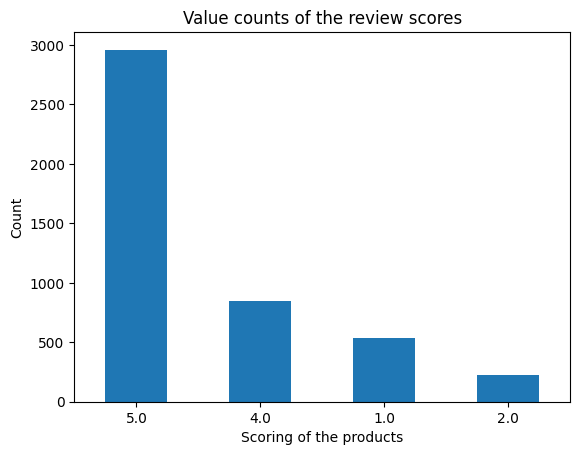

In [ ]:
products.overall.value_counts().plot(kind="bar")
plt.title("Value counts of the review scores")
plt.xlabel("Scoring of the products")
plt.xticks(rotation=0)
plt.ylabel("Count")
plt.show()

The next variable I want to examine is the sentiment of the reviews with a plot.

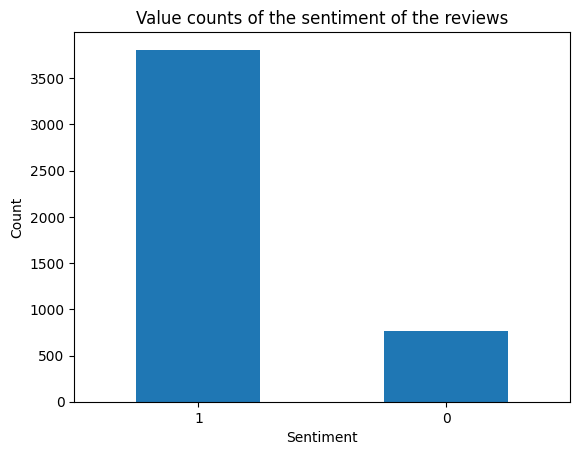

In [ ]:
products.sentiment.value_counts().plot(kind="bar")
plt.title("Value counts of the sentiment of the reviews")
plt.xlabel("Sentiment")
plt.xticks(rotation=0)
plt.ylabel("Count")
plt.show()

Then, I want to know the specific quantities for each sentiment.

In [ ]:
products['sentiment'].value_counts()

1    3808
0     762
Name: sentiment, dtype: int64

The goal is to discover intriguing relationships that demonstrate the influence of one variable on another, preferably on the target: sentiment. This information is valuable and provides the ability to act strategically. 

In a scatterplot, pairplot plots all variables against each other. It is extremely helpful for capturing the most important relationships without doing every single possible combination.

<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


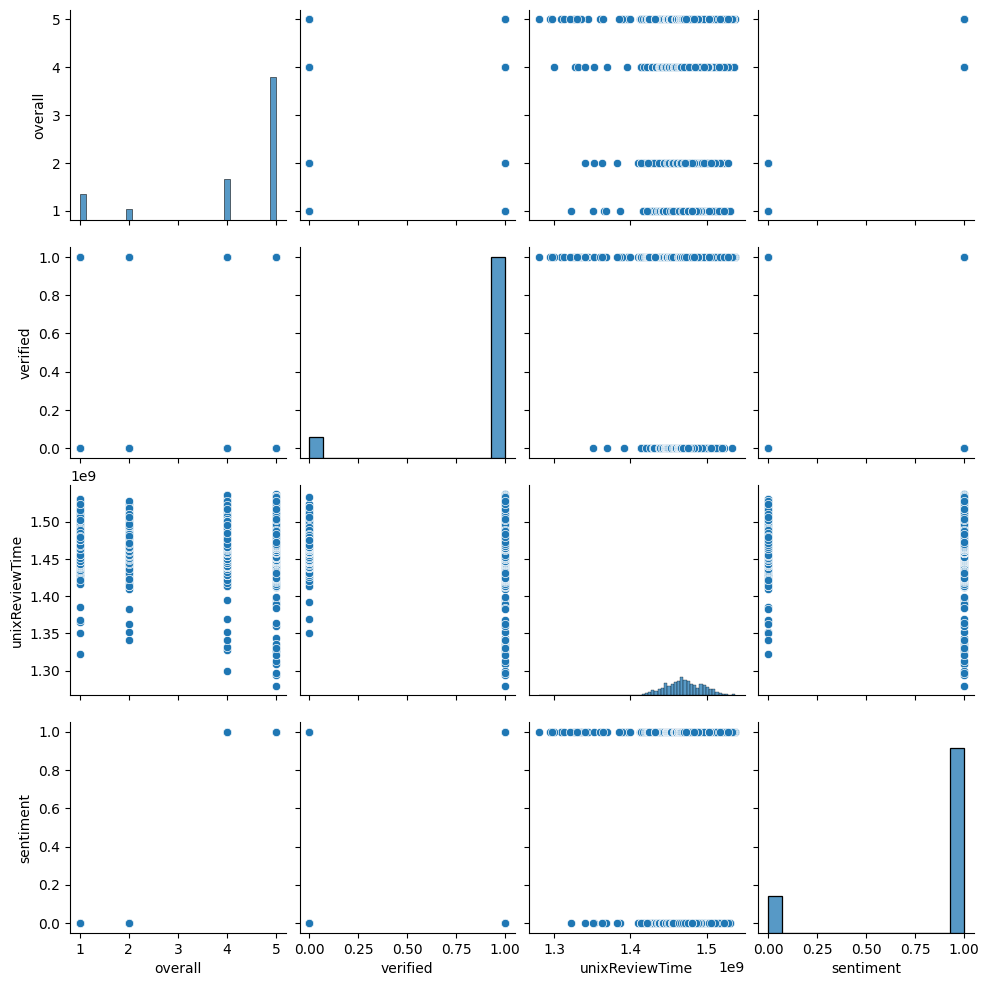

In [ ]:
sns.pairplot(products)

Using the Altair library, I wanted to plot the productID and review score from 1 to 5, aiming to broadly observing and analyzing this data, before going into a machine learning model.

In [ ]:
alt.Chart(products).mark_bar().encode(
    x = 'asin',
    y = 'overall'
)

alt.Chart(...)

This next visualization is intended to analyze the sentiment (positive or negative) based on the reviewTime in years, with a color differentiation for each review score, from 1 to 5 (without taking 3 into account because it is neutral). We can see that from 2011 to a little over 2014, there were more positive sentiment reviews than negative, with mostly 5.0 scores; since 2015, both positive and negative records have had many more records, but there is still a higher number of positive sentiments with the predominant scores being 1.0 and 5.0.

In [ ]:
DeepnoteChart(products, """{"mark":{"clip":true,"type":"point","tooltip":true},"config":{"legend":{}},"$schema":"https://vega.github.io/schema/vega-lite/v5.json","encoding":{"x":{"sort":"ascending","type":"temporal","field":"reviewTime","scale":{"type":"linear","zero":false}},"y":{"sort":null,"type":"nominal","field":"sentiment","scale":{"type":"linear","zero":false}},"color":{"sort":null,"type":"nominal","field":"overall","scale":{"scheme":"set1"}}}}""")

The following visualization is intended to show the overall sentiment based on the productID (asin) and the number of records with positive and negative sentiment. We can see that the quantity of positive sentiment varies significantly compared to the negative one; for example, we have 43 records of positive reviews for the product B000PHANNM, 44 records of positive reviews for the product B00I0VHS10, and 12 records of negative reviews for the product B000KPIHQ4. Most of the number of records for the negative reviews is around 1.

In [ ]:
DeepnoteChart(products, """{"mark":{"clip":true,"type":"bar","tooltip":true},"config":{"legend":{}},"$schema":"https://vega.github.io/schema/vega-lite/v5.json","encoding":{"x":{"sort":null,"type":"nominal","field":"sentiment","scale":{"type":"linear"}},"y":{"sort":null,"type":"nominal","field":"asin","scale":{"type":"linear"}},"color":{"sort":null,"type":"nominal","scale":{"scheme":"tableau10"},"aggregate":"count"}}}""")

Correlation heatmap

Presents the same correlation matrices data but in a more visually appealing format. The heatmap is useful because it allows us to quickly determine which variables are highly correlated with one another. Furthermore, they indicate at a glance which variables are correlated, to what extent, and in which direction, as well as potential multicollinearity issues.

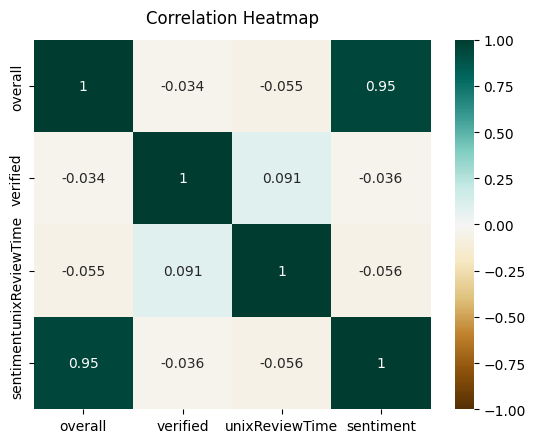

In [ ]:
heatmap = sns.heatmap(products.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG') # Set colormap range from -1 to 1, set cmap list of colors as BrBG, and set the annotation to True to display the correlation values.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12); # Assign a title to the heatmap.

### Word Cloud Graphic

A word cloud, also known as a tag cloud, is a visual representation of the words that comprise a text, with larger words appearing more frequently.

Negative sentiment: 0

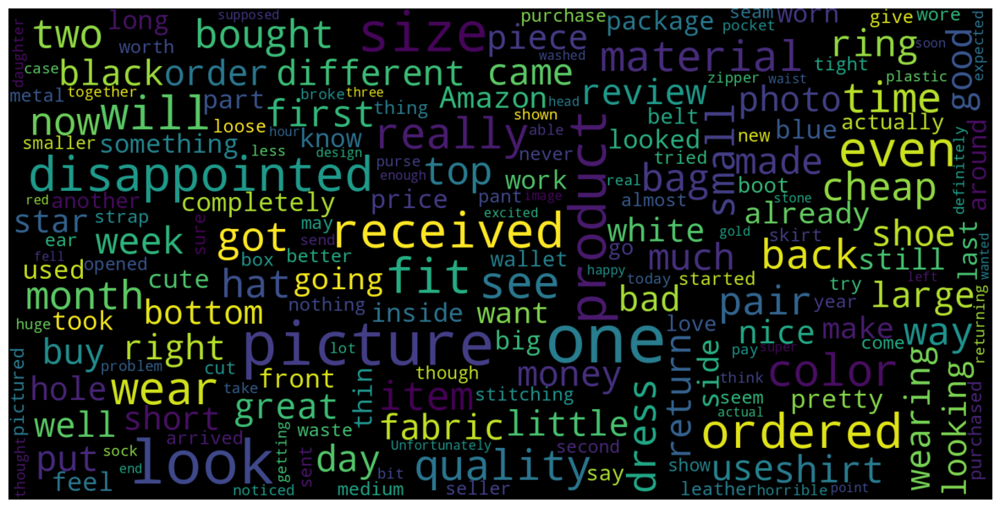

In [ ]:
consolidated = ' '.join(word for word in products['reviewText'][products['sentiment'] == 0].astype(str))
wordCloud = WordCloud(width=1600, height=800, random_state=21, max_font_size=110)
plt.figure(figsize=(15,10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

> The following keywords were found in the analysis of the negative sentiment reviewText: disappointed, different, size, picture, and received. This reveals that some of the most common problems with bad customer experiences, and thus negative sentiment in the reviews, could be related to receiving a different size or fit than expected, the clothes being different from the picture, and the feeling of disappointment they now associate with the garment. This is something that needs to be improved by the supplier in order to improve the customer satisfaction.

Positive sentiment: 1

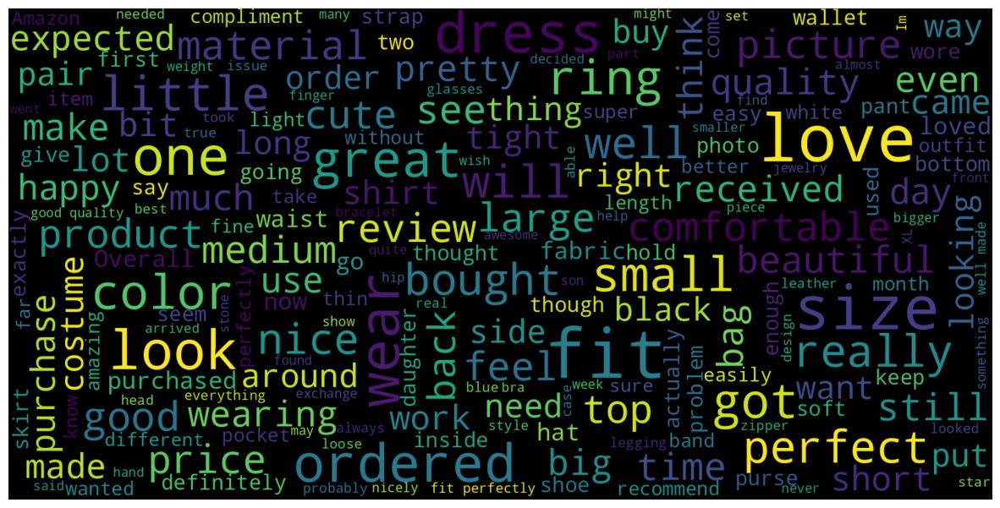

In [ ]:
consolidated = ' '.join(word for word in products['reviewText'][products['sentiment'] == 1].astype(str))
wordCloud = WordCloud(width=1600, height=800, random_state=21, max_font_size=110)
plt.figure(figsize=(15,10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

> Some of the keywords found in the analysis of the negative sentiment reviewText were: love, fit, perfect, great, price, and size. This reveals that the most common positive sentiment associated with the review was probably because the clothes fit great, they loved the product and thought it was great and perfect for what they ordered, and the quality-price relationship. This demonstrates the strong points in the sales, so it should be keep that way and use it when promoting the products.

## Sentiment Classifier Model

Import all the necessary libraries for the modeling.

In [ ]:
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, DetCurveDisplay, RocCurveDisplay

First, it is necessary to define the input variable X and the output variable y.

In [ ]:
X = products['review_features'] 
y = products['sentiment']

The next step is to divide the dataset into two parts: training and testing.
The scikit-learn library's train_test_split function is useful. The training dataset will be used to train the model (75%), and the test dataset will be used to test its performance (25%).

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

Use the scikit-learn library's CountVectorizer. It creates a vector that contains all of the words in the string (converts a set of text documents into a token count matrix), then we fit the train and test data with it.

In [ ]:
cv = CountVectorizer()
X_train_cv = cv.fit_transform(X_train)
X_test_cv = cv.transform(X_test)

One of the most fundamental and often used algorithms for solving a classification problem is logistic regression. Since its underlying methodology is very similar to that of linear regression, it is known as "logistic regression." The Logit function, which is utilized in this categorization method, is where the term "Logistic" originates.

Logistic equation:

![Picture title](image-20230108-211736.png)
 (Image courtesy: https://towardsdatascience.com/understanding-logistic-regression-9b02c2aec102)

Logistic Regression uses the Sigmoid function and if it comes across an outlier, it will take care of it.

![Picture title](image-20230108-211834.png)
(Image courtesy: https://towardsdatascience.com/understanding-logistic-regression-9b02c2aec102)

Because this is a binary classification, we will use LogisticRegression. Import the training data and fit it into the model.

In [ ]:
model = LogisticRegression()
model.fit(X_train_cv, y_train)

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

### Model Results

Predict the sentiments for the test data using the trained model described above. If the test features are managed to pass, it will predict the output Y, which is the sentiment data.

In [ ]:
y_pred_class = model.predict(X_test_cv)

Output the test data. 1 is for good reviews and 0 for bad reviews.

In [ ]:
y_pred_class

array([1, 1, 1, ..., 0, 0, 1])

Accuracy: is defined as the proportion of correct predictions to total predictions. It is one of the most basic model measures. For our model, we must strive for high accuracy. If a model has a high accuracy, we can conclude that it makes correct predictions the majority of the time.

![Picture title](image-20230108-215241.png)
(Image courtesy: https://towardsdatascience.com/understanding-accuracy-recall-precision-f1-scores-and-confusion-matrices-561e0f5e328c)

Precision: is the ratio of the correct positive predictions to the total number of positive predictions.

![Picture title](image-20230108-215922.png)
(Image courtesy: https://towardsdatascience.com/understanding-accuracy-recall-precision-f1-scores-and-confusion-matrices-561e0f5e328c)

Recall: is calculated as the ratio of predicted positives to total positive labels.

![Picture title](image-20230108-215616.png)
(Image courtesy: https://towardsdatascience.com/understanding-accuracy-recall-precision-f1-scores-and-confusion-matrices-561e0f5e328c)

F1 Score: depends on both the Recall and Precision, it is the harmonic mean of both the values.

![Picture title](image-20230108-220021.png)
(Image courtesy: https://towardsdatascience.com/understanding-accuracy-recall-precision-f1-scores-and-confusion-matrices-561e0f5e328c)

While accuracy by itself cannot tell whether a model is good or terrible, accuracy when combined with precision, recall, and F1 Score can provide a good indication of the model's performance.

In [ ]:
print(f'Accuracy: {accuracy_score(y_test, y_pred_class)}')
print(f'Precision score: {precision_score(y_test, y_pred_class)}')
print(f'Recall score: {recall_score(y_test, y_pred_class)}')
print(f'F1 score: {f1_score(y_test, y_pred_class)}')

Accuracy: 0.9282589676290464
Precision score: 0.9457286432160804
Recall score: 0.9711042311661506
F1 score: 0.9582484725050916


> The accuracy of the model is 92.8%

> The precision score of the model is 94.6%

> The recall score of the model is 97.1%

> The F1 score of the model is 95.8%

Classification Report

Build a text report showing the main classification metrics.

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_class))

              precision    recall  f1-score   support

           0       0.81      0.69      0.75       174
           1       0.95      0.97      0.96       969

    accuracy                           0.93      1143
   macro avg       0.88      0.83      0.85      1143
weighted avg       0.93      0.93      0.93      1143



Confusion Matrix

A confusion matrix is a matrix to represent the number of True Positives, False Positives, True Negatives, and False Negatives.

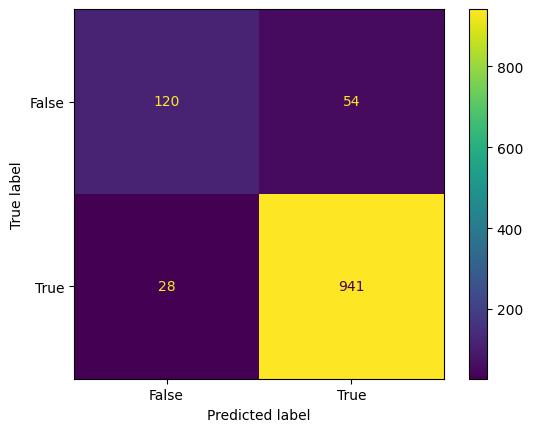

In [ ]:
cm = confusion_matrix(y_test, y_pred_class)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = [False, True])
cm_display.plot()
plt.show()

> The true positives have a value of 941 in this confusion matrix, followed by the true negatives, which have a value of 120, then 54 false positives, and 28 false negatives. Allowing us to infer and confirm that the model's accuracy is good, as calculated previously along with other measurements of the model's performance, with great results and a significantly lower percentage of false negatives and false positives.

Receiver Operating Characteristic (ROC) and Detection Error Tradeoff (DET)

The Y axis of ROC curves contains the true positive rate (TPR) and the X axis contains the false positive rate (FPR). This means that the "ideal" point is in the plot's upper left corner, with an FPR of zero and a TPR of one.

DET curves are ROC curves with the False Negative Rate (FNR) plotted on the y-axis instead of the TPR. The "ideal" point in this case is the origin (bottom left corner).

Visualy compare classifiers and their statistical performance across thresholds using the ROC and DET curves.

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

In [ ]:
classifiers = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(
        max_depth=5, n_estimators=10, max_features=1
    ),
    "Decision Tree Classifier": DecisionTreeClassifier(random_state=0),
    "K-Nearest Neighbors": KNeighborsClassifier(n_neighbors=3)
}

Plot ROC and DET curves. DET curves are typically plotted in standard deviate scale. To accomplish this, the DET display uses scipy.stats.norm to transform the error rates returned by the det curve and the axis scale.

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


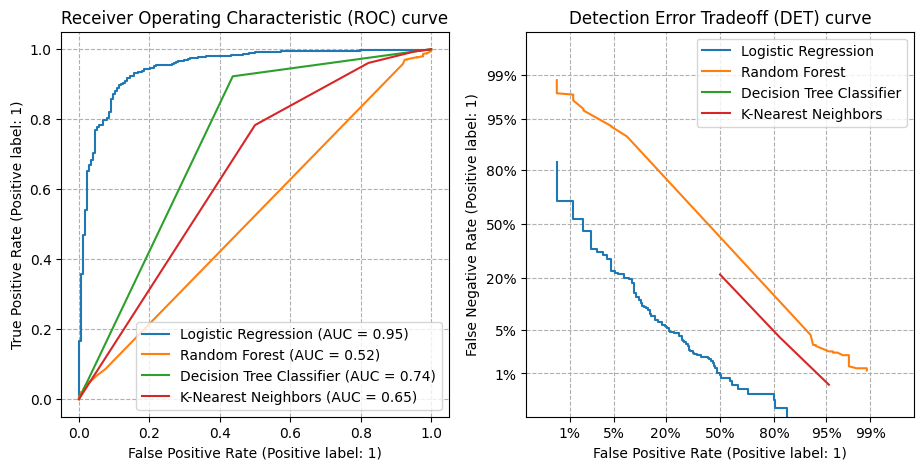

In [ ]:
fig, [ax_roc, ax_det] = plt.subplots(1, 2, figsize=(11, 5))

for name, clf in classifiers.items():
    clf.fit(X_train_cv, y_train)

    RocCurveDisplay.from_estimator(clf, X_test_cv, y_test, ax=ax_roc, name=name)
    DetCurveDisplay.from_estimator(clf, X_test_cv, y_test, ax=ax_det, name=name)

ax_roc.set_title("Receiver Operating Characteristic (ROC) curve")
ax_det.set_title("Detection Error Tradeoff (DET) curve")

ax_roc.grid(linestyle="--")
ax_det.grid(linestyle="--")

plt.legend()
plt.show()

> Comparing the four models with the ROC and DET curves, the best performance is indeed with the Logistic Regression with and AUC (Area under the ROC Curve) of 0.95. Therefore, is the model we keep for the metrics results and analysis of insights for this project.

# Insights

1. The data shows that there is a significant difference between the scores of the reviews, with 5.0 having the highest number of ratings and 2.0 having less than the others.

undefined. There is a noticeable difference in review data between years, with 2016 having 47% more data than any other year.

undefined. Positive sentiment outnumbers negative sentiment in general.

undefined. Analysis of sentiment by review time shows that from 2011 to a little over 2014, there were more positive sentiment reviews than negative.

undefined. The overall sentiment based on the product ID shows that the quantity of positive sentiment varies significantly compared to the negative one.

undefined. Negative sentiment reviewText keywords found include "disappointed," "different", "size", "picture", and "received", indicating that issues with size and product not matching the picture are common complaints.

undefined. Positive sentiment reviewText keywords found include "love", "fit", "perfect", "great", "price", and "size", indicating these are strong points in the sales, so it should be keep that way and use it when promoting the products.

undefined. The accuracy of the model was 92.8%, being able to classify the test data appropiately and giving a starting point to then use new data. The other metrics also showed a good performance of the model.

## References

References used for the development of this project

1. https://pandas.pydata.org/docs/index.html

undefined. https://nijianmo.github.io/amazon/index.html

undefined. https://scikit-learn.org/stable/modules/classes.html#module-sklearn.linear_model

undefined. https://towardsdatascience.com/understanding-logistic-regression-9b02c2aec102

undefined. https://towardsdatascience.com/top-10-binary-classification-algorithms-a-beginners-guide-feeacbd7a3e2

undefined. https://towardsdatascience.com/exploratory-data-analysis-in-python-a-step-by-step-process-d0dfa6bf94ee

undefined. https://scikit-learn.org/stable/auto_examples/model_selection/plot_det.html#sphx-glr-auto-examples-model-selection-plot-det-py

undefined. https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e 

undefined. https://huggingface.co/blog/sentiment-analysis-python

undefined. https://medium.com/analytics-vidhya/data-preparation-and-text-preprocessing-on-amazon-fine-food-reviews-7b7a2665c3f4

undefined. https://towardsdatascience.com/a-complete-sentiment-analysis-algorithm-in-python-with-amazon-product-review-data-step-by-step-2680d2e2c23b

undefined. https://youtu.be/ckLy603HQGI

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=ca492cb2-b768-4b0f-9560-c8ea5eccafcf' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>